# We will Start by importing necessary Libraries

In [1]:
#Data analysis and wrangling
import numpy as np
import pandas as pd

#visualization
import matplotlib.pyplot as plt
import seaborn as sns
import cufflinks as cf
from plotly.offline import download_plotlyjs, init_notebook_mode, plot, iplot

init_notebook_mode(connected = True)
cf.go_offline()
%matplotlib inline

# Acquiring the data
The Python Pandas packages helps us work with our datasets. We start by acquiring the dataset into Pandas DataFrames.

In [2]:
#Reading our csv file into pandas dataframe
df = pd.read_csv('train (3).csv')
df.head()

,Id,Province_State,Country_Region,Date,ConfirmedCases,Fatalities
0,1,NaN,Afghanistan,2020-01-22,0.0,0.0
1,2,NaN,Afghanistan,2020-01-23,0.0,0.0
2,3,NaN,Afghanistan,2020-01-24,0.0,0.0
3,4,NaN,Afghanistan,2020-01-25,0.0,0.0
4,5,NaN,Afghanistan,2020-01-26,0.0,0.0


# Now we will try to understand our data before doing any analysis


In [3]:
#Viewing the shape of the data to know how many features we have and how many rows 
df.shape

(25353, 6)

In [4]:
#As we can see there are null values on the Province_State
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 25353 entries, 0 to 25352
Data columns (total 6 columns):
Id                25353 non-null int64
Province_State    10773 non-null object
Country_Region    25353 non-null object
Date              25353 non-null object
ConfirmedCases    25353 non-null float64
Fatalities        25353 non-null float64
dtypes: float64(2), int64(1), object(3)
memory usage: 1.2+ MB


In [5]:
#How many null values do we have in each feature 
df.isnull().sum()

Id                    0
Province_State    14580
Country_Region        0
Date                  0
ConfirmedCases        0
Fatalities            0
dtype: int64

,Total,Percent
Province_State,14580,57.507987
Fatalities,0,0.000000
ConfirmedCases,0,0.000000
Date,0,0.000000
Country_Region,0,0.000000


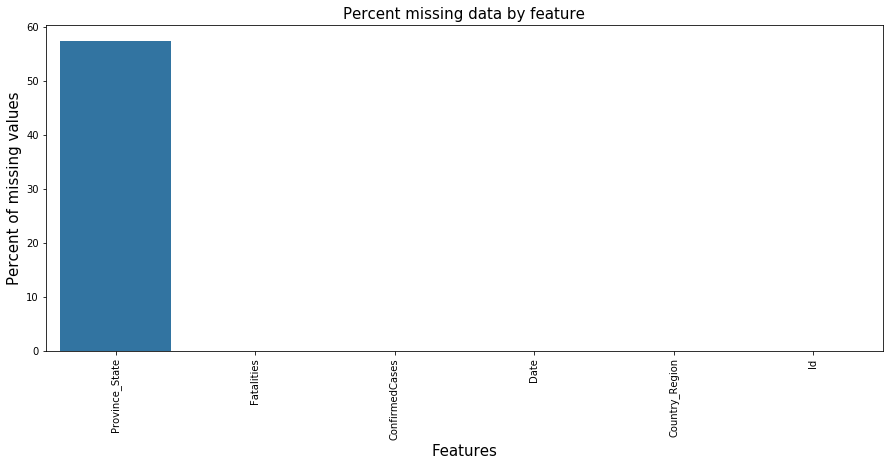

In [6]:
#Although, we won't care much about dealing with missing data for now
#But Plotting missing data can be very helpful in understanding our dataset
total = df.isnull().sum().sort_values(ascending=False)
percent = ((df.isnull().sum()/df.isnull().count()) * 100).sort_values(ascending=False)
missing_data = pd.concat([total, percent], axis=1, keys=['Total', 'Percent'])
f, ax = plt.subplots(figsize=(15, 6))
plt.xticks(rotation='90')
sns.barplot(x=missing_data.index, y=missing_data['Percent'])
plt.xlabel('Features', fontsize=15)
plt.ylabel('Percent of missing values', fontsize=15)
plt.title('Percent missing data by feature', fontsize=15)
missing_data.head()

# Now that we have a little bit understanding about our data
## Let's now determine which features are important in our analysis and which is not

In [7]:
# How many unique values in our Id column
# I know this sounds strange as when seeing id you know that it will be unique but some datasets have duplicated id values 
df.Id.nunique()

25353

In [8]:
# Now we are trying to find how many unique values are presented in Province_state column 
# Finding unique values may help us have better understanding of our data
print(f"It has { df.Province_State.nunique() } unique values and it's top 5 values are:")
print('-'*50)
print(df.Province_State.value_counts(dropna=False).head())

It has 133 unique values and it's top 5 values are:
--------------------------------------------------
NaN         14580
Tasmania       81
Florida        81
Anhui          81
Shandong       81
Name: Province_State, dtype: int64


In [9]:
# trying to find how many unique values are presented in Country_Region column 
print(f"It has { df.Country_Region.nunique() } unique values and it's top 5 values are:")
print('-'*50)
print(df.Country_Region.value_counts(dropna=False).head())

It has 184 unique values and it's top 5 values are:
--------------------------------------------------
US                4374
China             2673
Canada             972
France             891
United Kingdom     891
Name: Country_Region, dtype: int64


In [10]:
df.ConfirmedCases.nunique()

2494

In [11]:
print(df.columns.values)

['Id' 'Province_State' 'Country_Region' 'Date' 'ConfirmedCases'
 'Fatalities']


# Now as you can see that none of those columns can give us better information 
## But we have the Date column which may help us understand more about our data
we must make sure that it's a datetime64 format cause as we saw above it is an object format  

In [12]:
# Convert Date from object to datetime64 format
df['Date'] = pd.to_datetime(df['Date'])

In [13]:
# As we can see day has 31 unique values which is better than before 
df.Date.dt.day.nunique()

31

In [14]:
# Month is even better as it has only 4 values
df.Date.dt.month.nunique()

4

In [15]:
# Year won't help us.. 
df.Date.dt.year.nunique()

1

## We can see now that date column actually can help us very much in our analysis 

In [16]:
# Create two columns for the day and month 
df['Day'] = df.Date.dt.day
df['Month'] = df.Date.dt.month

In [17]:
df.head()

,Id,Province_State,Country_Region,Date,ConfirmedCases,Fatalities,Day,Month
0,1,NaN,Afghanistan,2020-01-22,0.0,0.0,22,1
1,2,NaN,Afghanistan,2020-01-23,0.0,0.0,23,1
2,3,NaN,Afghanistan,2020-01-24,0.0,0.0,24,1
3,4,NaN,Afghanistan,2020-01-25,0.0,0.0,25,1
4,5,NaN,Afghanistan,2020-01-26,0.0,0.0,26,1


In [18]:
# We can drop the Date column as it we got what we wanted from it 
# we can also drop the id column as it doesn't give us any infromation 
df.drop(['Id', 'Date'], axis=1, inplace=True)

In [19]:
# Our dataframe now looks like this
df.head()

,Province_State,Country_Region,ConfirmedCases,Fatalities,Day,Month
0,NaN,Afghanistan,0.0,0.0,22,1
1,NaN,Afghanistan,0.0,0.0,23,1
2,NaN,Afghanistan,0.0,0.0,24,1
3,NaN,Afghanistan,0.0,0.0,25,1
4,NaN,Afghanistan,0.0,0.0,26,1


In [20]:
# Our features data types
df.dtypes

Province_State     object
Country_Region     object
ConfirmedCases    float64
Fatalities        float64
Day                 int64
Month               int64
dtype: object

In [21]:
# Know We want to know how to use the month column in our advantage
df.Month.value_counts(dropna=False)

3    9703
2    9077
4    3443
1    3130
Name: Month, dtype: int64

In [22]:
# Use describe function to know more about the month and if we can use it or not 
df.groupby('Month').describe()

ConfirmedCases                                                       \
               count         mean           std  min   25%    50%     75%   
Month                                                                       
1             3130.0    12.299042    169.168912  0.0   0.0    0.0     0.0   
2             9077.0   184.109397   2810.369838  0.0   0.0    0.0     0.0   
3             9703.0   916.210141   6003.095321  0.0   0.0   14.0   168.0   
4             3443.0  4313.191693  16821.237965  0.0  45.0  345.0  1495.0   

                    Day         ...                Fatalities              \
            max   count  mean   ...      75%   max      count        mean   
Month                           ...                                         
1        5806.0  3130.0  26.5   ...     29.0  31.0     3130.0    0.284026   
2       66337.0  9077.0  15.0   ...     22.0  29.0     9077.0    5.166575   
3      105792.0  9703.0  16.0   ...     24.0  31.0     9703.0   39.789137   
4      181026.0  3443.0   6.0   ...      9.0  11.0     3443.0  245.062446   

                                                  
               std  min  25%  50%   75%      max  
Month                                             
1         5.933166  0.0  0.0  0.0   0.0    204.0  
2        98.378168  0.0  0.0  0.0   0.0   2727.0  
3       407.317029  0.0  0.0  0.0   2.0  12428.0  
4      1431.641214  0.0  1.0  5.0  34.0  19468.0  

[4 rows x 24 columns]

# Time for some visualization
## We 'll use these libraries ( Matplotlib, Seaborn and plotly )

,Month,Count
0,1,3130
1,2,9077
2,3,9703
3,4,3443


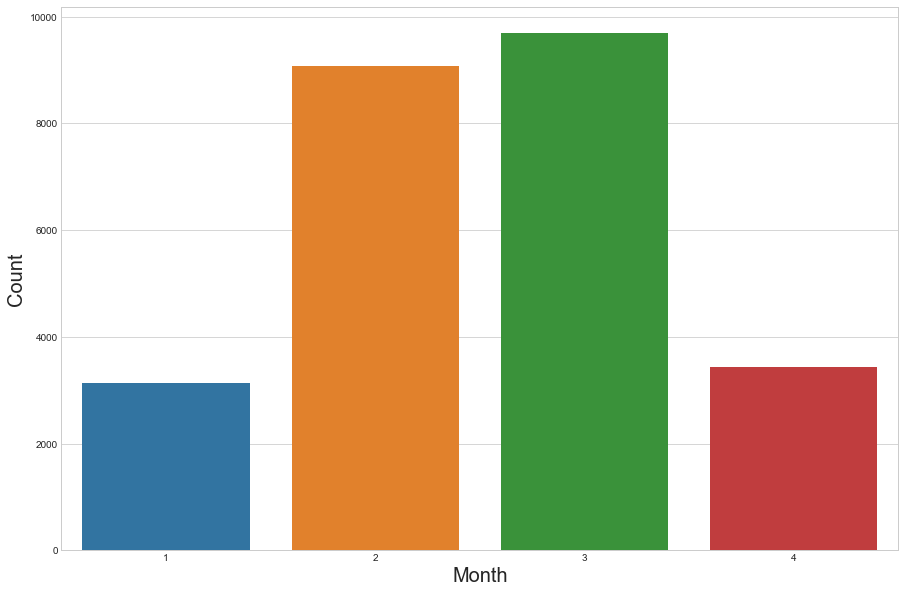

In [23]:
# Create a frequency distribution table as our month is a categorical variable although it's integer 
month_freq = df.groupby('Month').size().reset_index(name='Count')
plt.figure(figsize=(15, 10))
sns.set_style('whitegrid')
sns.countplot(x='Month', data=df)
plt.xlabel('Month', fontsize=20)
plt.ylabel('Count', fontsize=20)
month_freq

In [24]:
# Also can be done with plotly
# Creating a barplot for month column
df.iplot(kind = 'bar', x = 'Month', xTitle='Month', yTitle='Count')

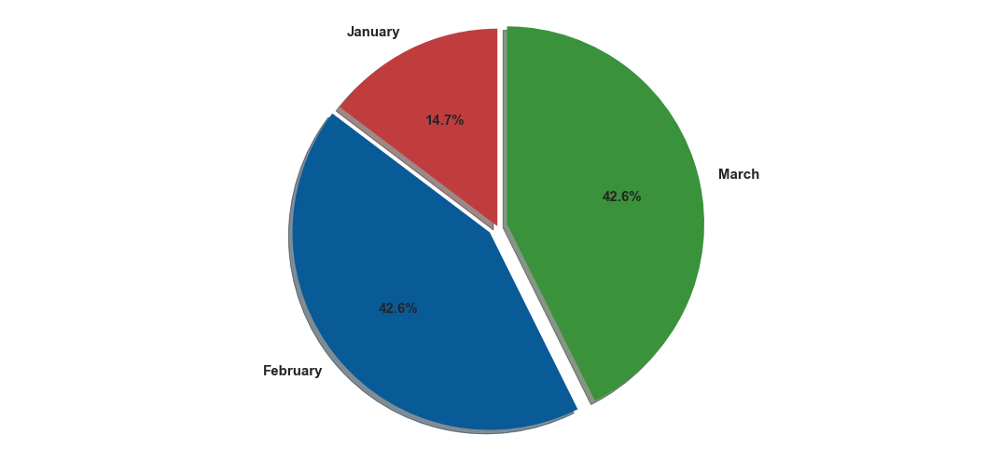

In [25]:
# Pie chart
# values for the chart
val = [df['Month'][df['Month'] == 1].count(),df['Month'][df['Month'] == 2].count(), df['Month'][df['Month'] == 2].count()]  # number of values of Jan, Feb & March
fig1, ax1 = plt.subplots(figsize=(15, 7))
ax1.pie(val, explode=(0, 0.05, 0.05), labels=['January', 'February', 'March'], colors=['#c03d3e','#095b97', '#3a923a'], autopct='%1.1f%%', shadow=True, startangle=90, textprops={'fontsize': 15, 'fontWeight':'bold'})
# Equal aspect ratio ensures that pie is drawn as a circle
ax1.axis('equal')
plt.tight_layout()
plt.show()

In [26]:
# Seeing the relation between Month and Fatalities
df.iplot(kind = 'bar', x = 'Month', y = 'Fatalities', xTitle='Month', yTitle='Fatalities')

(array([2.5182e+04, 1.0100e+02, 1.7000e+01, 1.2000e+01, 1.0000e+01,
        8.0000e+00, 7.0000e+00, 7.0000e+00, 5.0000e+00, 4.0000e+00]),
 array([    0. ,  1946.8,  3893.6,  5840.4,  7787.2,  9734. , 11680.8,
        13627.6, 15574.4, 17521.2, 19468. ]),
 <a list of 10 Patch objects>)

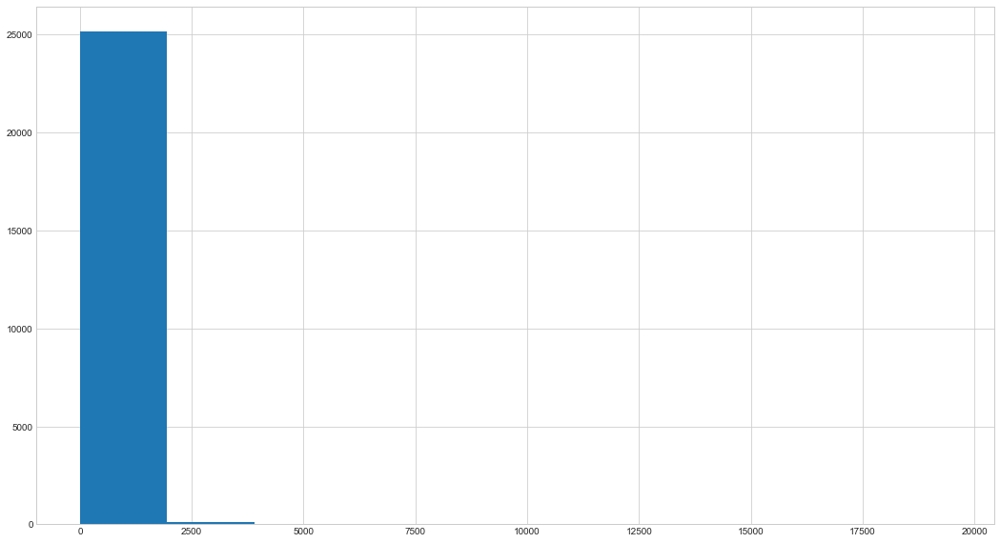

In [27]:
# Using histogram for Fatalities 
plt.figure(figsize=(18, 10))
plt.hist(df.Fatalities)

C:\Users\Omar\Anaconda3\lib\site-packages\matplotlib\axes\_axes.py:6462: UserWarning:

The 'normed' kwarg is deprecated, and has been replaced by the 'density' kwarg.



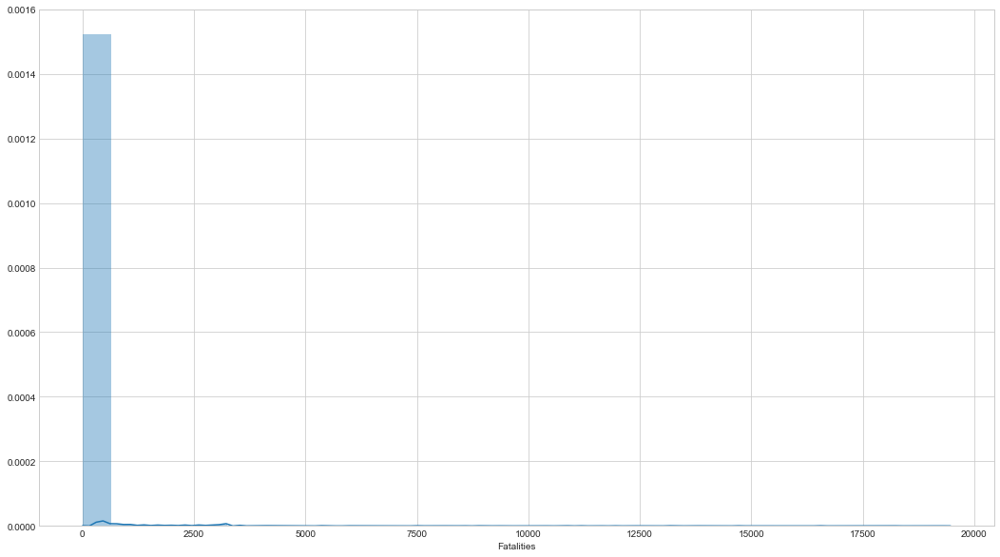

In [28]:
# Using the distribution plot from seaborn 
plt.figure(figsize=(18, 10))
sns.distplot(df.Fatalities.dropna(), bins=30)

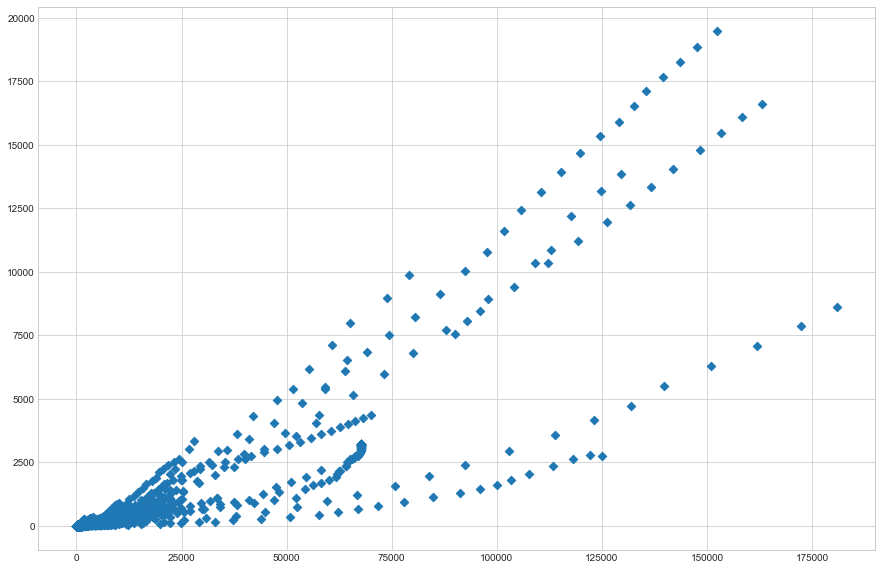

In [29]:
# Creating a scatter plot for ConfirmedCases & Fatalities
plt.figure(figsize=(15, 10))
plt.scatter(df.ConfirmedCases, df.Fatalities, marker='D')

In [30]:
df.iplot(x = 'ConfirmedCases', y = 'Fatalities')

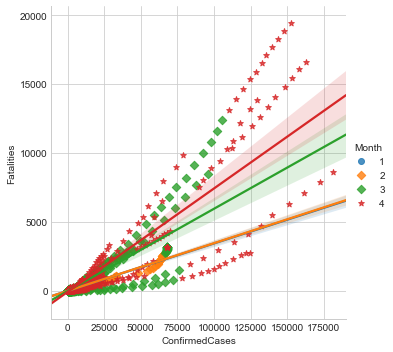

In [31]:
sns.lmplot(x='ConfirmedCases', y='Fatalities', data=df, hue='Month', markers=['o', 'D', 'D', '*'])

In [32]:
# Box plot for our dataset 
df.iplot(kind = 'box')

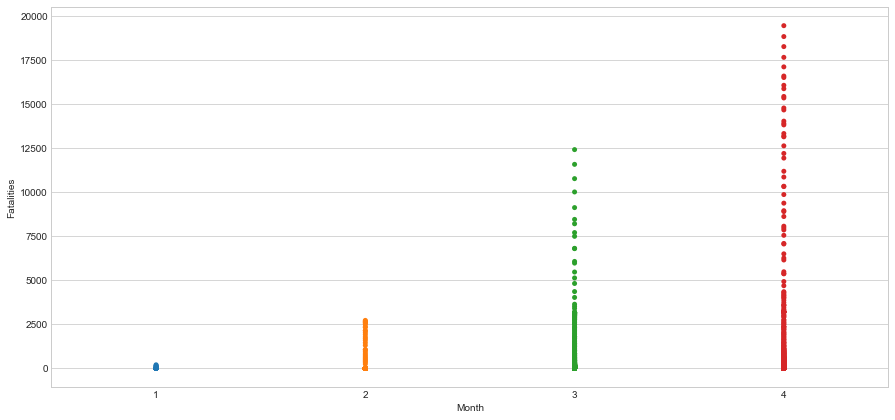

In [33]:
# stripplot showed that every month number of cases and Fatalities increases
plt.figure(figsize=(15, 7))
sns.stripplot(x='Month', y='Fatalities', data=df)

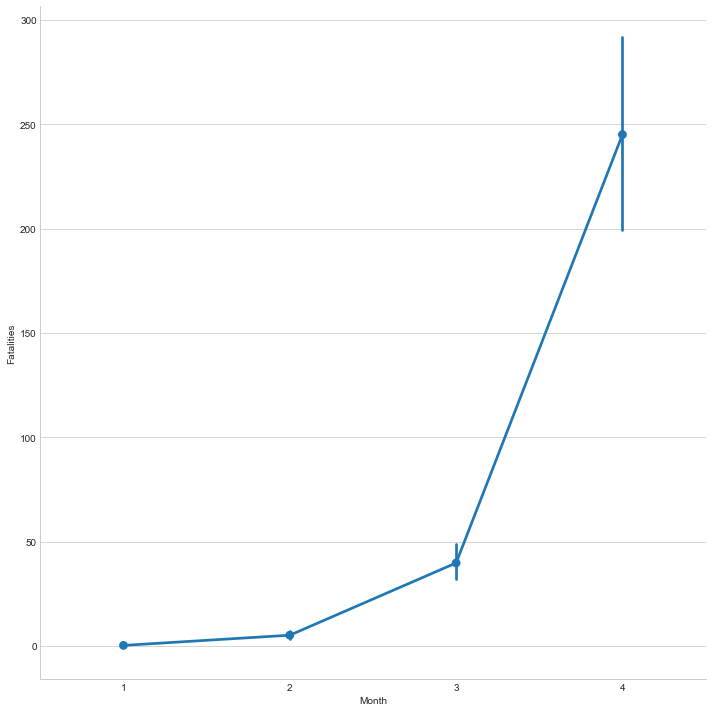

In [34]:
sns.factorplot(x='Month', y='Fatalities', data=df, size=10)

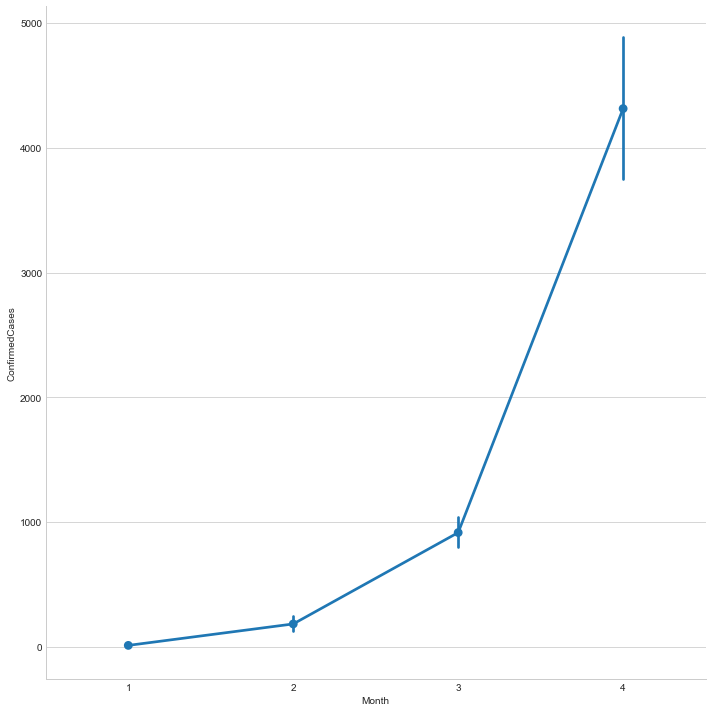

In [35]:
sns.factorplot(x='Month', y='ConfirmedCases', data=df, size=10)

<Figure size 1440x864 with 0 Axes>

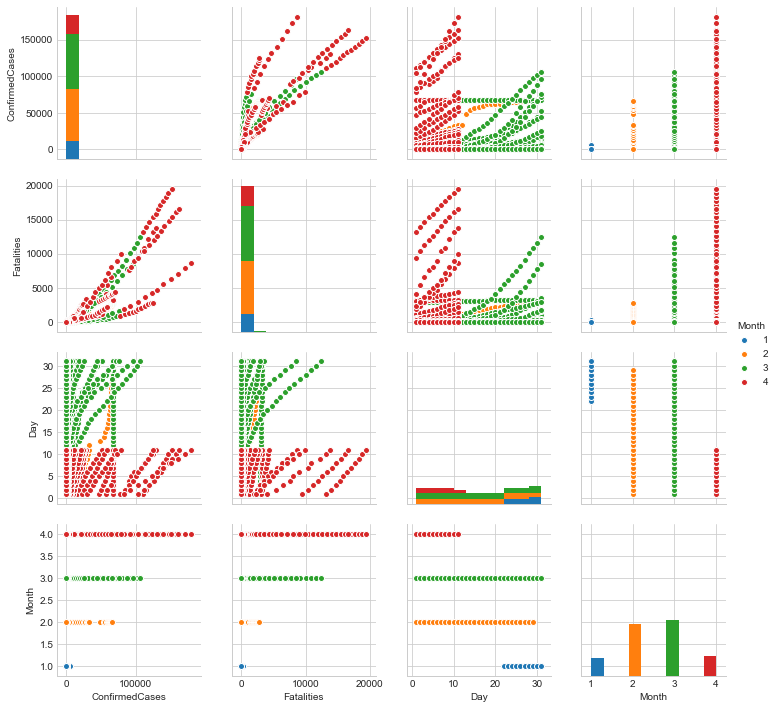

In [36]:
plt.figure(figsize=(20, 12))
sns.pairplot(df, hue='Month')

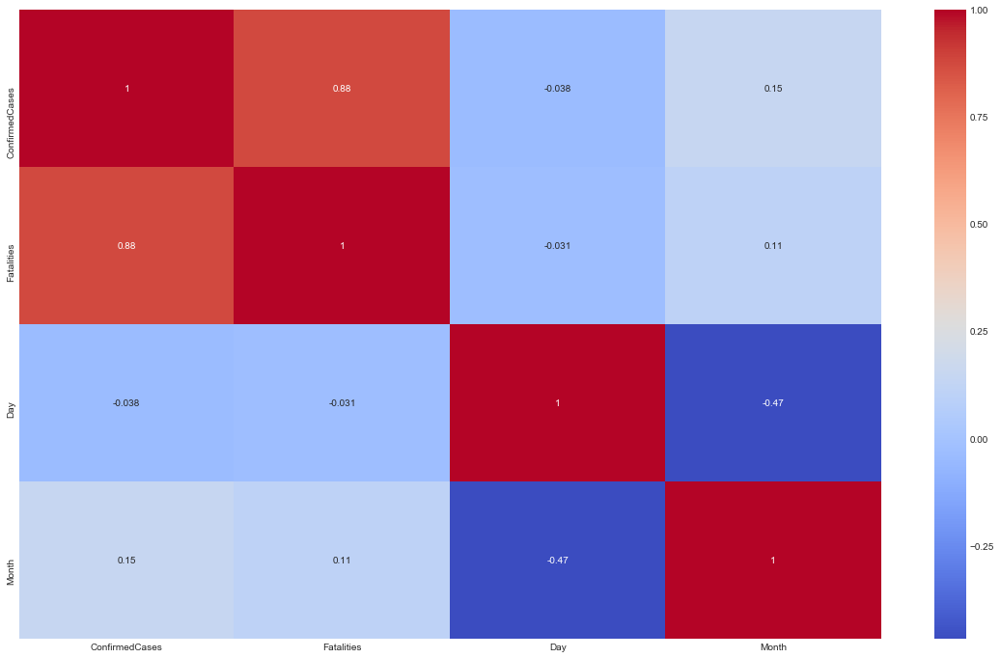

In [37]:
# Creating a coorelation heatmap to how features are affected by each other (relationship between features)
# using correlation coefficient 
plt.figure(figsize=(20, 12))
sns.heatmap(df.corr(),annot=True, cmap='coolwarm')